In [ ]:
!pip install praat-parselmouth librosa matplotlib numpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.7/10.7 MB 66.4 MB/s eta 0:00:00


In [ ]:
import parselmouth
from parselmouth.praat import call
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from google.colab import files
uploaded = files.upload()
audio_path = list(uploaded.keys())[0]

sound = parselmouth.Sound(audio_path)

Saving audio-data_taukdial-067-1.wav to audio-data_taukdial-067-1.wav


In [ ]:
from IPython.display import Audio
Audio(audio_path)

In [ ]:
pitch = sound.to_pitch()

pitch_values = pitch.selected_array['frequency']
pitch_times = pitch.xs()

pitch_values[pitch_values == 0] = np.nan

In [ ]:
mean_f0 = np.nanmean(pitch_values)

# Create flattened version using PSOLA
# This changes pitch to constant mean_f0
manipulation = call(sound, "To Manipulation", 0.01, 75, 600)
pitch_tier = call(manipulation, "Extract pitch tier")

# Clear original pitch points and add constant pitch
call(pitch_tier, "Remove points between", 0, sound.duration)
call(pitch_tier, "Add point", 0, mean_f0)
call(pitch_tier, "Add point", sound.duration, mean_f0)

# Replace pitch tier in manipulation
call([pitch_tier, manipulation], "Replace pitch tier")

# Synthesize flattened audio
sound_flat = call(manipulation, "Get resynthesis (overlap-add)")

In [ ]:
y_orig, sr = librosa.load(audio_path, sr=16000)
sound_flat.save("temp_flat.wav", "WAV")
y_flat, _ = librosa.load("temp_flat.wav", sr=16000)

D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y_orig)), ref=np.max)
D_flat = librosa.amplitude_to_db(np.abs(librosa.stft(y_flat)), ref=np.max)

In [ ]:
pitch_flat = sound_flat.to_pitch()
pitch_values_flat = pitch_flat.selected_array['frequency']
pitch_times_flat = pitch_flat.xs()

pitch_values_flat[pitch_values_flat == 0] = np.nan

print(f"Flattened pitch values: min={np.nanmin(pitch_values_flat)}, max={np.nanmax(pitch_values_flat)}, mean={np.nanmean(pitch_values_flat)}")

Flattened pitch values: min=235.51589914378556, max=525.0146324306, mean=261.4514879262361


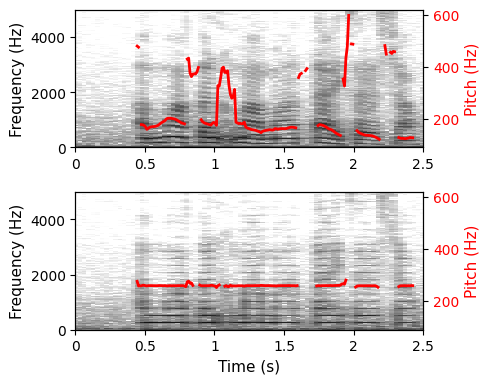

Mean F0: 258.7 Hz
Pitch y-axis range: 89.3 - 619.9 Hz


In [ ]:
# custom font sizes thingy
LABEL_SIZE = 11
TICK_SIZE = 10

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 4))
# i decreased the fig size to 5/4 instead of 10/8 to fit the new half column size, rather than scaling up fonts absurdly

# Calculate appropriate y-axis range for pitch
pitch_min = min(np.nanmin(pitch_values), mean_f0) - 20
pitch_max = max(np.nanmax(pitch_values), mean_f0) + 20

# Top panel - Original
img1 = librosa.display.specshow(D_orig, sr=sr, x_axis='time', y_axis='hz', ax=ax1, cmap='gray_r')
ax1.set_ylim([0, 5000])
ax1.set_xlim([0, 2.5])
ax1.set_ylabel('Frequency (Hz)', fontsize=LABEL_SIZE)
ax1.set_xlabel('')
ax1.tick_params(axis='both', labelsize=TICK_SIZE)

# Overlay pitch contour on right y-axis
ax1_pitch = ax1.twinx()
ax1_pitch.plot(pitch_times, pitch_values, 'r-', linewidth=2)
ax1_pitch.set_ylabel('Pitch (Hz)', fontsize=LABEL_SIZE, color='r')
ax1_pitch.set_ylim([pitch_min, pitch_max])
ax1_pitch.tick_params(axis='y', labelcolor='r', labelsize=TICK_SIZE)

# Bottom panel - Flattened
img2 = librosa.display.specshow(D_flat, sr=sr, x_axis='time', y_axis='hz',
                                ax=ax2, cmap='gray_r')
ax2.set_ylim([0, 5000])
ax2.set_xlim([0, 2.5])
ax2.set_ylabel('Frequency (Hz)', fontsize=LABEL_SIZE)
ax2.set_xlabel('Time (s)', fontsize=LABEL_SIZE)
ax2.tick_params(axis='both', labelsize=TICK_SIZE)

# Overlay flat pitch contour
ax2_pitch = ax2.twinx()
ax2_pitch.plot(pitch_times_flat, pitch_values_flat, 'r-', linewidth=2)
ax2_pitch.set_ylabel('Pitch (Hz)', fontsize=LABEL_SIZE, color='r')
ax2_pitch.set_ylim([pitch_min, pitch_max])
ax2_pitch.tick_params(axis='y', labelcolor='r', labelsize=TICK_SIZE)

plt.tight_layout()
plt.savefig('figFlattening.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"Mean F0: {mean_f0:.1f} Hz")
print(f"Pitch y-axis range: {pitch_min:.1f} - {pitch_max:.1f} Hz")